In [27]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import tree


In [28]:
pet_finder = pd.read_csv("train.csv")
pet_finder.head()

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,...,Health,Quantity,Fee,State,RescuerID,VideoAmt,Description,PetID,PhotoAmt,AdoptionSpeed
0,2,Nibble,3,299,0,1,1,7,0,1,...,1,1,100,41326,8480853f516546f6cf33aa88cd76c379,0,Nibble is a 3+ month old ball of cuteness. He ...,86e1089a3,1.0,2
1,2,No Name Yet,1,265,0,1,1,2,0,2,...,1,1,0,41401,3082c7125d8fb66f7dd4bff4192c8b14,0,I just found it alone yesterday near my apartm...,6296e909a,2.0,0
2,1,Brisco,1,307,0,1,2,7,0,2,...,1,1,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,Their pregnant mother was dumped by her irresp...,3422e4906,7.0,3
3,1,Miko,4,307,0,2,1,2,0,2,...,1,1,150,41401,9238e4f44c71a75282e62f7136c6b240,0,"Good guard dog, very alert, active, obedience ...",5842f1ff5,8.0,2
4,1,Hunter,1,307,0,1,1,0,0,2,...,1,1,0,41326,95481e953f8aed9ec3d16fc4509537e8,0,This handsome yet cute boy is up for adoption....,850a43f90,3.0,2


In [29]:
pet_finders = pet_finder.copy()


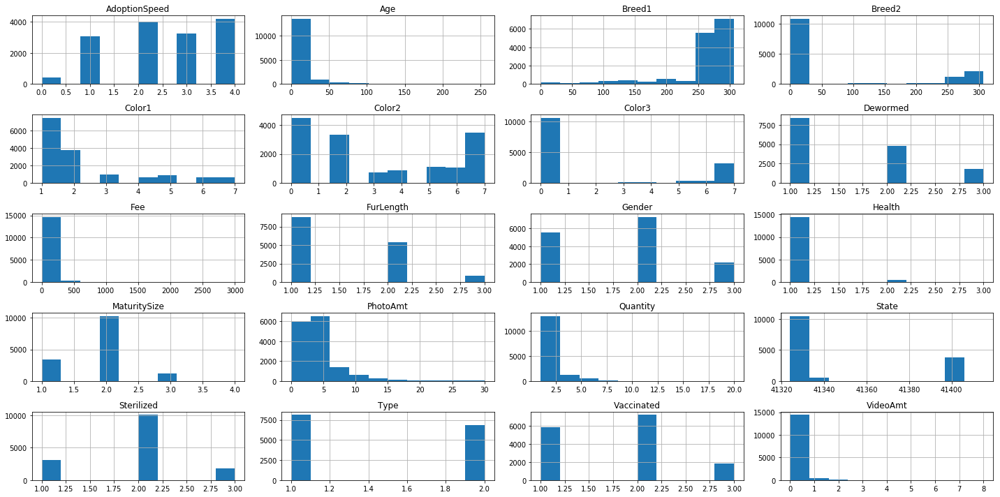

In [30]:
# Exploration of the distribution of all data
pet_finders.hist(figsize=(20, 10))
plt.tight_layout()

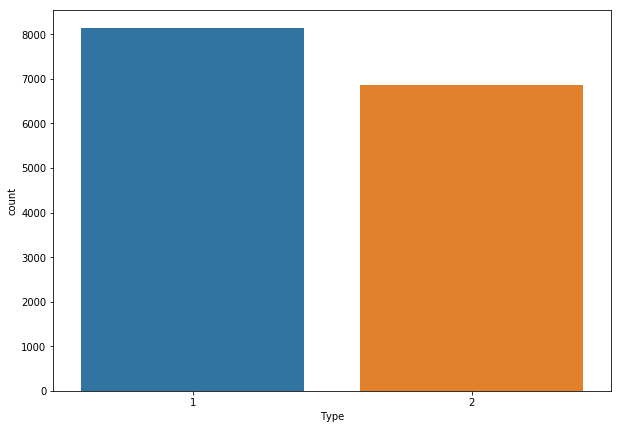

In [31]:
import seaborn as sns
fig, ax= plt.subplots(figsize=(10,7))
sns.countplot(x='Type', data=pet_finders)

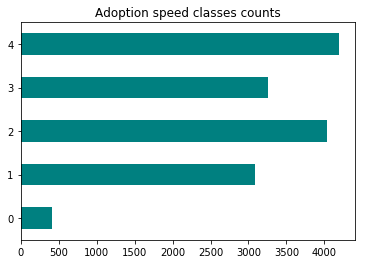

In [32]:
pet_finder['AdoptionSpeed'].value_counts().sort_index().plot('barh', color='teal');
plt.title('Adoption speed classes counts');

In [33]:
pet_finders.isnull().values.any()

True

In [34]:
pet_finder = pet_finders.drop(['Description','Name','RescuerID','PetID'], axis=1)

In [35]:
data = pet_finder.drop('AdoptionSpeed', axis=1)
target = pet_finder['AdoptionSpeed']
feature_names = data.columns
data.head()

,Type,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,State,VideoAmt,PhotoAmt
0,2,3,299,0,1,1,7,0,1,1,2,2,2,1,1,100,41326,0,1.0
1,2,1,265,0,1,1,2,0,2,2,3,3,3,1,1,0,41401,0,2.0
2,1,1,307,0,1,2,7,0,2,2,1,1,2,1,1,0,41326,0,7.0
3,1,4,307,0,2,1,2,0,2,1,1,1,2,1,1,150,41401,0,8.0
4,1,1,307,0,1,1,0,0,2,1,2,2,2,1,1,0,41326,0,3.0


In [36]:
#Splitting Data into training and validation set

from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(data, target, random_state=100)
print("Shape of X_train:", X_train.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_val:", y_val.shape)

Shape of X_train: (11244, 19)
Shape of X_val: (3749, 19)
Shape of y_train: (11244,)
Shape of y_val: (3749,)


In [38]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=200)
rf = rf.fit(X_train, y_train)
rf.score(X_val, y_val)

0.4123766337690051

In [39]:
sorted(zip(rf.feature_importances_, feature_names), reverse=True)

[(0.13633248717753485, 'PhotoAmt'),
 (0.12683416911924256, 'Age'),
 (0.08153509549753828, 'Color2'),
 (0.07916786890713336, 'Color1'),
 (0.07662185662107406, 'Breed1'),
 (0.0643257674735947, 'State'),
 (0.05329574691506836, 'Breed2'),
 (0.04462235667604255, 'Gender'),
 (0.04424132684382748, 'FurLength'),
 (0.041122043526725535, 'Quantity'),
 (0.04098878133709393, 'Color3'),
 (0.040927676943401534, 'MaturitySize'),
 (0.03993791117060571, 'Fee'),
 (0.03554015423146372, 'Dewormed'),
 (0.03277448493236877, 'Vaccinated'),
 (0.030457504493712127, 'Sterilized'),
 (0.011881126476205615, 'VideoAmt'),
 (0.010112581326381619, 'Health'),
 (0.009281060330985046, 'Type')]

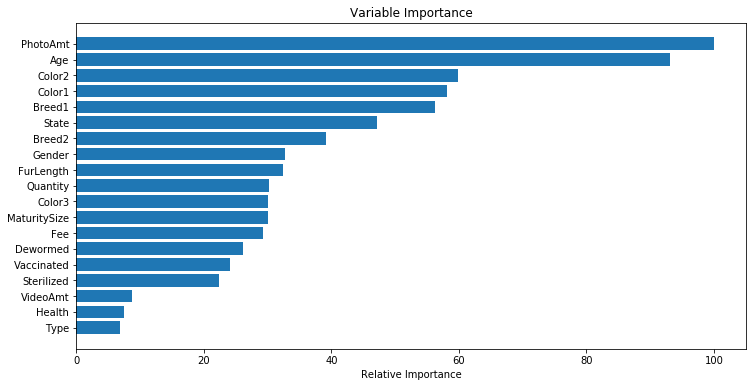

In [41]:
# Plot feature importance https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html#sklearn.svm.SVR
feature_importance = rf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
# plt.subplot(1, 2, 2)
plt.figure(figsize=(12, 6))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_train.keys()[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()


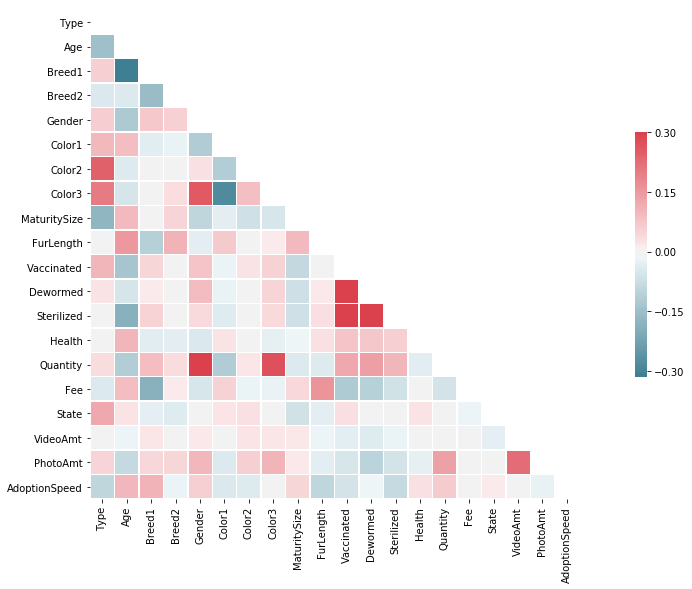

In [42]:
# Correlation matrix
#A correlation matrix is a table showing correlation coefficients between variables.
#Each cell in the table shows the correlation between two variables.

corr = pet_finders.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
               square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [13]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [14]:
pet_finders

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,State,RescuerID,VideoAmt,Description,PetID,PhotoAmt,AdoptionSpeed
0,2,Nibble,3,299,0,1,1,7,0,1,1,2,2,2,1,1,100,41326,8480853f516546f6cf33aa88cd76c379,0,Nibble is a 3+ month old ball of cuteness. He ...,86e1089a3,1.0,2
1,2,No Name Yet,1,265,0,1,1,2,0,2,2,3,3,3,1,1,0,41401,3082c7125d8fb66f7dd4bff4192c8b14,0,I just found it alone yesterday near my apartm...,6296e909a,2.0,0
2,1,Brisco,1,307,0,1,2,7,0,2,2,1,1,2,1,1,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,Their pregnant mother was dumped by her irresp...,3422e4906,7.0,3
3,1,Miko,4,307,0,2,1,2,0,2,1,1,1,2,1,1,150,41401,9238e4f44c71a75282e62f7136c6b240,0,"Good guard dog, very alert, active, obedience ...",5842f1ff5,8.0,2
4,1,Hunter,1,307,0,1,1,0,0,2,1,2,2,2,1,1,0,41326,95481e953f8aed9ec3d16fc4509537e8,0,This handsome yet cute boy is up for adoption....,850a43f90,3.0,2
5,2,NaN,3,266,0,2,5,6,0,2,1,2,2,2,1,1,0,41326,22fe332bf9c924d4718005891c63fbed,0,This is a stray kitten that came to my house. ...,d24c30b4b,2.0,2
6,2,BULAT,12,264,264,1,1,0,0,2,3,2,2,3,1,1,300,41326,1e0b5a458b5b77f5af581d57ebf570b3,0,anyone within the area of ipoh or taiping who ...,1caa6fcdb,3.0,1
7,1,Siu Pak & Her 6 Puppies,0,307,0,2,1,2,7,2,1,2,2,2,1,6,0,41326,1fba5f6e5480946254590d48f9c5198d,0,Siu Pak just give birth on 13/6/10 to 6puppies...,97aa9eeac,9.0,3
8,2,NaN,2,265,0,2,6,0,0,2,2,2,2,2,1,1,0,41326,d8af7afece71334473575c9f70daf00d,0,"healthy and active, feisty kitten found in nei...",c06d167ca,6.0,1
9,2,Kitty,12,265,0,2,1,7,0,2,2,3,3,3,1,1,0,41326,1f3f36e4b18e94855b3e88af0852fdc4,0,"Very manja and gentle stray cat found, we woul...",7a0942d61,2.0,4


In [43]:
pet_finders.dtypes

Type               int64
Name              object
Age                int64
Breed1             int64
Breed2             int64
Gender             int64
Color1             int64
Color2             int64
Color3             int64
MaturitySize       int64
FurLength          int64
Vaccinated         int64
Dewormed           int64
Sterilized         int64
Health             int64
Quantity           int64
Fee                int64
State              int64
RescuerID         object
VideoAmt           int64
Description       object
PetID             object
PhotoAmt         float64
AdoptionSpeed      int64
dtype: object

In [9]:
#pet_finders['Description'] =pet_finders.Description.astype('category')
#pet_finders['PetID'] =pet_finders.PetID.astype('category')
#pet_finders['RescuerID'] =pet_finders.RescuerID.astype('category')
#pet_finders['Name'] =pet_finders.Name.astype('category')


In [44]:
pet_finders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14993 entries, 0 to 14992
Data columns (total 24 columns):
Type             14993 non-null int64
Name             13736 non-null object
Age              14993 non-null int64
Breed1           14993 non-null int64
Breed2           14993 non-null int64
Gender           14993 non-null int64
Color1           14993 non-null int64
Color2           14993 non-null int64
Color3           14993 non-null int64
MaturitySize     14993 non-null int64
FurLength        14993 non-null int64
Vaccinated       14993 non-null int64
Dewormed         14993 non-null int64
Sterilized       14993 non-null int64
Health           14993 non-null int64
Quantity         14993 non-null int64
Fee              14993 non-null int64
State            14993 non-null int64
RescuerID        14993 non-null object
VideoAmt         14993 non-null int64
Description      14981 non-null object
PetID            14993 non-null object
PhotoAmt         14993 non-null float64
AdoptionSpe

# Logistic Regression

In [45]:
#Create a Logistic Regression Model
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression()
classifier



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [46]:
#Fit (train) or model using the training data
classifier.fit(X_train, y_train)




C:\Users\Faithalone_Data\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Faithalone_Data\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [47]:
#Validate the model using the validation data
print(f"Training Data Score: {classifier.score(X_train, y_train)}")
print(f"Validation Data Score: {classifier.score(X_val, y_val)}")


Training Data Score: 0.3327997154037709
Validation Data Score: 0.3214190450786876


In [48]:
#Make predictions
predictions = classifier.predict(X_val)
pd.DataFrame({"Prediction": predictions, "Actual": y_val}).reset_index(drop=True)

,Prediction,Actual
0,4,4
1,4,4
2,2,3
3,4,4
4,4,2
5,2,3
6,1,3
7,4,4
8,1,2
9,2,1


# Random Forest Model

In [35]:
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)
clf.score(X_val, y_val)

0.32515337423312884

In [36]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=200)
rf = rf.fit(X_train, y_train)
rf.score(X_val, y_val)

0.41611096292344624

In [39]:
# cross validation score for the random forest classifier with cohen_kappa_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, cohen_kappa_score, accuracy_score
cross_val_score(rf, X_train, y_train, cv=5, scoring=make_scorer(cohen_kappa_score))

array([0.18300567, 0.17751594, 0.18199245, 0.21783433, 0.19660418])

In [41]:
# Make prediction
predictions_rf = rf.predict(X_val)
pd.DataFrame({"Prediction": predictions_rf, "Actual": y_val}).reset_index(drop=True)

,Prediction,Actual
0,2,4
1,2,4
2,4,3
3,2,4
4,4,2
5,3,3
6,3,3
7,4,4
8,3,2
9,2,1


In [50]:
# Limit depth of tree to 3 levels
from sklearn.ensemble import RandomForestRegressor
rf_small = RandomForestRegressor(n_estimators=10, max_depth = 3)
rf_small.fit(X_train,y_train)
# Extract the small tree
tree_small = rf_small.estimators_[5]
# Save the tree as a png image
tree.export_graphviz(tree_small, out_file = 'small_tree.dot', feature_names = feature_names, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree.dot')
graph.write_png('small_tree.png');

NameError: name 'pydot' is not defined